# Drug Discovery using Machine Learning in Python

Install the ChEMBL web service package so that we can retrieve bioactivity data from the ChEMBL Database.

In [1]:
! pip install chembl_webresource_client

In [2]:
import pandas as pd
from chembl_webresource_client.new_client import new_client

# Search for Target protein (Acetylcholinesterase)

In [3]:
target = new_client.target
target_query = target.search('acetylcholinesterase')
targets = pd.DataFrame.from_dict(target_query) 
targets.head(10)

,cross_references,organism,pref_name,score,species_group_flag,target_chembl_id,target_components,target_type,tax_id
0,[],Drosophila melanogaster,Acetylcholinesterase,18.0,False,CHEMBL2242744,"[{'accession': 'P07140', 'component_descriptio...",SINGLE PROTEIN,7227
1,[],Homo sapiens,Acetylcholinesterase,16.0,False,CHEMBL220,"[{'accession': 'P22303', 'component_descriptio...",SINGLE PROTEIN,9606
2,[],Torpedo californica,Acetylcholinesterase,16.0,False,CHEMBL4780,"[{'accession': 'P04058', 'component_descriptio...",SINGLE PROTEIN,7787
3,[],Mus musculus,Acetylcholinesterase,16.0,False,CHEMBL3198,"[{'accession': 'P21836', 'component_descriptio...",SINGLE PROTEIN,10090
4,[],Rattus norvegicus,Acetylcholinesterase,16.0,False,CHEMBL3199,"[{'accession': 'P37136', 'component_descriptio...",SINGLE PROTEIN,10116
5,[],Electrophorus electricus,Acetylcholinesterase,16.0,False,CHEMBL4078,"[{'accession': 'O42275', 'component_descriptio...",SINGLE PROTEIN,8005
6,[],Bos taurus,Acetylcholinesterase,16.0,False,CHEMBL4768,"[{'accession': 'P23795', 'component_descriptio...",SINGLE PROTEIN,9913
7,[],Bemisia tabaci,AChE2,16.0,False,CHEMBL2366409,"[{'accession': 'B3SST5', 'component_descriptio...",SINGLE PROTEIN,7038
8,[],Leptinotarsa decemlineata,Acetylcholinesterase,16.0,False,CHEMBL2366490,"[{'accession': 'Q27677', 'component_descriptio...",SINGLE PROTEIN,7539
9,[],Nephotettix cincticeps,Ace-orthologous acetylcholinesterase,16.0,False,CHEMBL2366514,"[{'accession': 'Q9NJH6', 'component_descriptio...",SINGLE PROTEIN,94400


# Select and retrieve bioactivity data for Human Acetylcholinesterase (second entry)

In [4]:
selected_target = targets.target_chembl_id[1]
selected_target

'CHEMBL220'

In [5]:
activity = new_client.activity
res = activity.filter(target_chembl_id=selected_target).filter(standard_type="IC50")

What is IC50? IC50 (Half Maximal Inhibitory Concentration) is a common pharmacological measure used to evaluate the effectiveness of a compound in inhibiting a biological or biochemical function.

Definition: IC50 represents the concentration of a compound required to inhibit a specific biological process (or enzyme activity) by 50%.

Acetylcholinesterase is an enzyme that breaks down acetylcholine, a neurotransmitter, in the nervous system. IC50 measures how effectively a drug or compound inhibits acetylcholinesterase activity, which is crucial in drug discovery for conditions like Alzheimer’s disease and myasthenia gravis.

Lower IC50 values indicate higher potency because less compound is needed to inhibit the enzyme.

By specifying standard_type="IC50", the query excludes other types of activity measures (e.g., EC50, Ki, or Kd) that may not be directly relevant for assessing inhibition potency.

In [6]:
df = pd.DataFrame.from_dict(res)

In [7]:
pd.set_option('display.max_columns', None)  
df.head(10)

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,None,33969,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1,None,None,CHEMBL1148382,J Med Chem,2004.0,"{'bei': '19.61', 'le': '0.36', 'lle': '3.32', ...",CHEMBL133897,None,CHEMBL133897,6.12,0,http://www.openphacts.org/units/Nanomolar,252547,=,1,1,=,None,IC50,nM,None,750.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,None,None,IC50,uM,UO_0000065,None,0.75
1,None,None,37563,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1,None,None,CHEMBL1148382,J Med Chem,2004.0,"{'bei': '18.57', 'le': '0.38', 'lle': '2.45', ...",CHEMBL336398,None,CHEMBL336398,7.00,0,http://www.openphacts.org/units/Nanomolar,252533,=,1,1,=,None,IC50,nM,None,100.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,None,None,IC50,uM,UO_0000065,None,0.1
2,None,None,37565,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1,None,None,CHEMBL1148382,J Med Chem,2004.0,None,CHEMBL131588,None,CHEMBL131588,None,0,http://www.openphacts.org/units/Nanomolar,252530,>,1,1,>,None,IC50,nM,None,50000.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,None,None,IC50,uM,UO_0000065,None,50.0
3,None,None,38902,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F,None,None,CHEMBL1148382,J Med Chem,2004.0,"{'bei': '16.11', 'le': '0.34', 'lle': '1.81', ...",CHEMBL130628,None,CHEMBL130628,6.52,0,http://www.openphacts.org/units/Nanomolar,252534,=,1,1,=,None,IC50,nM,None,300.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,None,None,IC50,uM,UO_0000065,None,0.3
4,None,None,41170,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C,None,None,CHEMBL1148382,J Med Chem,2004.0,"{'bei': '17.60', 'le': '0.36', 'lle': '3.00', ...",CHEMBL130478,None,CHEMBL130478,6.10,0,http://www.openphacts.org/units/Nanomolar,252552,=,1,1,=,None,IC50,nM,None,800.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,None,None,IC50,uM,UO_0000065,None,0.8
5,None,None,42363,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1,None,None,CHEMBL1148382,J Med Chem,2004.0,"{'bei': '16.60', 'le': '0.32', 'lle': '1.54', ...",CHEMBL130112,None,CHEMBL130112,5.62,0,http://www.openphacts.org/units/Nanomolar,252551,=,1,1,=,None,IC50,nM,None,2400.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,None,None,IC50,uM,UO_0000065,None,2.4
6,None,None,43561,[],CHEMBL643384,Inhibitory concentration against acetylcholine...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C,None,None,CHEMBL1148382,J Med Chem,2004.0,"{'bei': '23.59', 'le': '0.50', 'lle': '4.15', ...",CHEMBL130098,None,CHEMBL130098,7.00,0,http://www.openphacts.org/units/Nanomolar,252525,=,1,1,=,None,IC50,nM,None,100.0,CHEMBL220,Homo sapiens,Acetylcholinesterase,9606,

The lower the standard value, the higher the potency of the drug.

In [8]:
df.to_csv('acetylcholinesterase_bioactivity_data.csv', index=False)

# Handling missing data

If any compounds has missing value for the standard_value and canonical_smiles column then drop it.

In [9]:
df = df[df.standard_value.notna()]
df = df[df.canonical_smiles.notna()]

In [10]:
len(df.canonical_smiles.unique())

6642

Remove the compounds with duplicate canonical smiles

In [11]:
df = df.drop_duplicates(['canonical_smiles'])

# Data pre-processing of the bioactivity data

In [12]:
selection = ['molecule_chembl_id','canonical_smiles','standard_value']
df = df[selection]
df.head(10)

,molecule_chembl_id,canonical_smiles,standard_value
0,CHEMBL133897,CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1,750.0
1,CHEMBL336398,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1,100.0
2,CHEMBL131588,CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1,50000.0
3,CHEMBL130628,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F,300.0
4,CHEMBL130478,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C,800.0
5,CHEMBL130112,CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1,2400.0
6,CHEMBL130098,CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C,100.0
7,CHEMBL337486,CCCCCCSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N1CCOCC1,50000.0
8,CHEMBL336538,COc1ccc(-c2nc(SC)n(C(=O)N(C)C)n2)cc1,800.0
9,CHEMBL131051,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)c1ccccc1,50000.0


In [13]:
df.to_csv('acetylcholinesterase_bioactivity_data_preprocessed.csv', index=False)

In [14]:
df_processed = pd.read_csv('acetylcholinesterase_bioactivity_data_preprocessed.csv')

Compounds having standard value of less than 1000 nM will be considered to be active while those greater than 10,000 nM will be considered to be inactive. As for those values in between 1,000 and 10,000 nM will be referred to as intermediate.

In [15]:
bioactivity_threshold = []
for i in df_processed.standard_value:
  if float(i) >= 10000:
    bioactivity_threshold.append("inactive")
  elif float(i) <= 1000:
    bioactivity_threshold.append("active")
  else:
    bioactivity_threshold.append("intermediate")

In [16]:
bioactivity_class = pd.Series(bioactivity_threshold, name='class')
df_processed = pd.concat([df_processed, bioactivity_class], axis=1)
df_processed.head(10)

,molecule_chembl_id,canonical_smiles,standard_value,class
0,CHEMBL133897,CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1,750.0,active
1,CHEMBL336398,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1,100.0,active
2,CHEMBL131588,CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1,50000.0,inactive
3,CHEMBL130628,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F,300.0,active
4,CHEMBL130478,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C,800.0,active
5,CHEMBL130112,CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1,2400.0,intermediate
6,CHEMBL130098,CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C,100.0,active
7,CHEMBL337486,CCCCCCSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N1CCOCC1,50000.0,inactive
8,CHEMBL336538,COc1ccc(-c2nc(SC)n(C(=O)N(C)C)n2)cc1,800.0,active
9,CHEMBL131051,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)c1ccccc1,50000.0,inactive


In [17]:
df_processed.to_csv('acetylcholinesterase_bioactivity_data_curated.csv', index=False)

In [18]:
df_curated = pd.read_csv('acetylcholinesterase_bioactivity_data_curated.csv')

In [19]:
!pip install rdkit

In [20]:
import rdkit

In [21]:
from rdkit import Chem
from rdkit.Chem import Descriptors, Lipinski
import numpy as np

# Calculate Lipinski Descriptors

Lipinski's rule of five is a concept frequently used in drug discovery. This rule helps to predict if a biologically active molecule is likely to have the chemical and physical properties to be orally bioavailable. The Lipinski rule bases pharmacokinetic drug properties such as absorption, distribution, metabolism and excretion on specific physicochemical properties such as:

- No more than 5 hydrogen bond donors
- No more than 10 hydrogen bond acceptors
- Molecular mass less than 500 Da
- Partition coefficient not greater than 5

According to Lipinski's rule of five, an orally active drug can have no more than one violation of these conditions.

In [22]:
def lipinski(smiles):

    moldata= []
    for elem in smiles:
        mol=Chem.MolFromSmiles(elem) 
        moldata.append(mol)        
# Each SMILES string in the given smiles series is converted to a molecular object using Chem.MolFromSmiles (from RDKit).
       
    baseData= np.arange(1,1)    
# baseData is initialized as an empty NumPy array. The use of np.arange(1,1) creates an array with no elements.

    i=0  
    for mol in moldata:        
       
        desc_MolWt = Descriptors.MolWt(mol)
        desc_MolLogP = Descriptors.MolLogP(mol)
        desc_NumHAcceptors = Descriptors.NumHAcceptors(mol)
        desc_NumHDonors = Descriptors.NumHDonors(mol) 
                
        row = np.array([desc_MolWt,desc_MolLogP,desc_NumHAcceptors,desc_NumHDonors])           
    
        if(i==0):
            baseData=row
        else:
            baseData=np.vstack([baseData, row])
        i=i+1 
# If it’s the first molecule (i==0), baseData is assigned the first row.
# For subsequent molecules, np.vstack (vertical stacking) appends the new row to baseData, creating a 2D array where each row corresponds to a molecule.
    
    columnNames=["MolWt","MolLogP","NumHAcceptors","NumHDonors"]   
    descriptors = pd.DataFrame(data=baseData,columns=columnNames)
    
    return descriptors

Reference : https://codeocean.com/explore/capsules?query=tag:data-curation

In [23]:
df_lipinski = lipinski(df_curated.canonical_smiles)
df_lipinski.head(10)

,MolWt,MolLogP,NumHAcceptors,NumHDonors
0,312.325,2.80320,6.0,0.0
1,376.913,4.55460,5.0,0.0
2,426.851,5.35740,5.0,0.0
3,404.845,4.70690,5.0,0.0
4,346.334,3.09530,6.0,0.0
5,338.436,4.07992,5.0,0.0
6,296.783,2.85010,5.0,0.0
7,408.955,4.57120,6.0,0.0
8,292.364,2.20530,6.0,0.0
9,408.405,4.67010,6.0,0.0


In [24]:
df_combined = pd.concat([df_curated, df_lipinski], axis = 1)
df_combined.head(10)

,molecule_chembl_id,canonical_smiles,standard_value,class,MolWt,MolLogP,NumHAcceptors,NumHDonors
0,CHEMBL133897,CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1,750.0,active,312.325,2.80320,6.0,0.0
1,CHEMBL336398,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1,100.0,active,376.913,4.55460,5.0,0.0
2,CHEMBL131588,CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1,50000.0,inactive,426.851,5.35740,5.0,0.0
3,CHEMBL130628,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F,300.0,active,404.845,4.70690,5.0,0.0
4,CHEMBL130478,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C,800.0,active,346.334,3.09530,6.0,0.0
5,CHEMBL130112,CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1,2400.0,intermediate,338.436,4.07992,5.0,0.0
6,CHEMBL130098,CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C,100.0,active,296.783,2.85010,5.0,0.0
7,CHEMBL337486,CCCCCCSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N1CCOCC1,50000.0,inactive,408.955,4.57120,6.0,0.0
8,CHEMBL336538,COc1ccc(-c2nc(SC)n(C(=O)N(C)C)n2)cc1,800.0,active,292.364,2.20530,6.0,0.0
9,CHEMBL131051,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)c1ccccc1,50000.0,inactive,408.405,4.67010,6.0,0.0


To allow IC50 data to be more uniformly distributed, we will convert IC50 to the negative logarithmic scale which is essentially - log 10(IC50).
The custom function pIC50() which we wiil create will accept a DataFrame as input and will:
﻿Take the IC50 values from the standard_value column and convert it from nM to M by multiplying the value by 10^-9
﻿Take the molar value and apply -log10
﻿Delete the standard_value column and create a new pIC50 column

In [25]:
df_combined.standard_value.describe()

count    6.642000e+03
mean     1.026835e+05
std      8.884597e+05
min      0.000000e+00
25%      1.592500e+02
50%      2.600000e+03
75%      1.713000e+04
max      4.960000e+07
Name: standard_value, dtype: float64

If values exceeds 100,000,000, they will be capped at 100,000,000 to ensure the logarithmic result remains valid and non-negative. However, since the maximum value in our dataset is already less than 100,000,000, so this capping step won't be required.

In [26]:
def pIC50(input):
    pIC50 = []
    for i in input['standard_value']:
        molar = i * (10**-9) # Converts nM to M
        pIC50.append(-np.log10(molar))
        
    input['pIC50'] = pIC50
    x = input.drop('standard_value', axis = 1)
    return x

In [27]:
df_final = pIC50(df_combined)
df_final.head(10)

C:\Users\MIRON\AppData\Local\Temp\ipykernel_15216\1270151156.py:5: RuntimeWarning: divide by zero encountered in log10
  pIC50.append(-np.log10(molar))


,molecule_chembl_id,canonical_smiles,class,MolWt,MolLogP,NumHAcceptors,NumHDonors,pIC50
0,CHEMBL133897,CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1,active,312.325,2.80320,6.0,0.0,6.124939
1,CHEMBL336398,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1,active,376.913,4.55460,5.0,0.0,7.000000
2,CHEMBL131588,CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1,inactive,426.851,5.35740,5.0,0.0,4.301030
3,CHEMBL130628,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F,active,404.845,4.70690,5.0,0.0,6.522879
4,CHEMBL130478,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C,active,346.334,3.09530,6.0,0.0,6.096910
5,CHEMBL130112,CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1,intermediate,338.436,4.07992,5.0,0.0,5.619789
6,CHEMBL130098,CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C,active,296.783,2.85010,5.0,0.0,7.000000
7,CHEMBL337486,CCCCCCSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N1CCOCC1,inactive,408.955,4.57120,6.0,0.0,4.301030
8,CHEMBL336538,COc1ccc(-c2nc(SC)n(C(=O)N(C)C)n2)cc1,active,292.364,2.20530,6.0,0.0,6.096910
9,CHEMBL131051,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)c1ccccc1,inactive,408.405,4.67010,6.0,0.0,4.301030


In [28]:
class_counts = df_final['class'].value_counts()
class_counts

active          2744
inactive        2225
intermediate    1673
Name: class, dtype: int64

In [29]:
df_final.pIC50.describe()

count    6642.000000
mean             inf
std              NaN
min         1.304518
25%         4.766243
50%         5.585027
75%         6.797922
max              inf
Name: pIC50, dtype: float64

In [30]:
df_final[df_final['pIC50'] == float('inf')]

,molecule_chembl_id,canonical_smiles,class,MolWt,MolLogP,NumHAcceptors,NumHDonors,pIC50
5463,CHEMBL4780352,COc1cc2c(cc1OC)C(=O)/C(=C/c1ccc(OCCCCN[N+]3(C)...,active,824.813,4.0002,9.0,1.0,inf


In [31]:
df_final = df_final[df_final['pIC50'] != float('inf')]

In [32]:
df_final.pIC50.describe()

count    6641.000000
mean        5.801767
std         1.558782
min         1.304518
25%         4.765989
50%         5.585027
75%         6.795880
max        14.301030
Name: pIC50, dtype: float64

# Removing the "intermediate" bioactivity class

In [33]:
df_2class = df_final[df_final['class'] != "intermediate"]

In [34]:
class_counts = df_2class['class'].value_counts()
class_counts

active      2743
inactive    2225
Name: class, dtype: int64

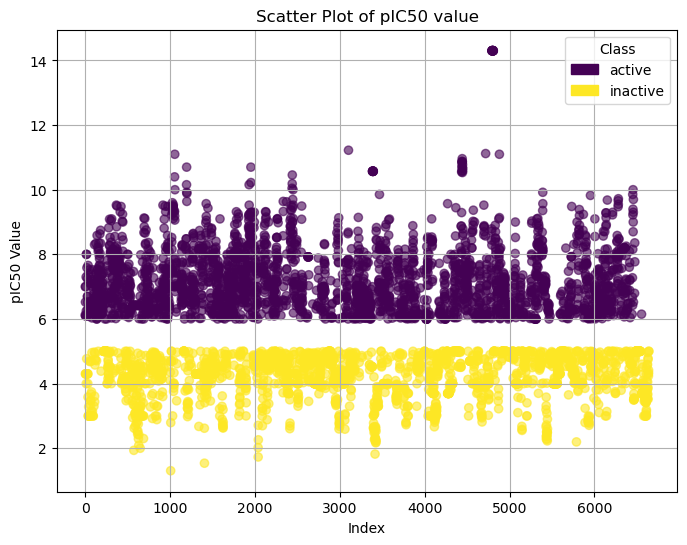

In [35]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

unique_classes = df_2class['class'].unique()
class_to_color = {cls: idx / (len(unique_classes) - 1) for idx, cls in enumerate(unique_classes)}

plt.figure(figsize=(8, 6))
scatter = plt.scatter(df_2class.index, df_2class['pIC50'], c=df_2class['class'].map(class_to_color), alpha=0.6, cmap='viridis')

plt.title('Scatter Plot of pIC50 value')
plt.xlabel('Index')
plt.ylabel('pIC50 Value')

legend_handles = [mpatches.Patch(color=plt.cm.viridis(class_to_color[cls]), label=cls) for cls in unique_classes]
plt.legend(handles=legend_handles, title="Class")

plt.grid(True)
plt.show()

Active compounds typically have lower IC50 values (meaning they are effective at lower concentrations), which translates to higher pIC50 values (due to the logarithmic transformation). These compounds will appear in the upper part of the pIC50 plot.

Inactive compounds, on the other hand, have higher IC50 values (meaning they are ineffective at lower concentrations), which translates to lower pIC50 values (again due to the log transformation). These compounds will appear in the lower part of the pIC50 plot.

The transformation of IC50 to pIC50 makes it easier to visualize the differentiation between active and inactive compounds, as the plot becomes more linear and the data points are more spread out and uniform.

# Exploratory Data Analysis (Chemical Space Analysis) via Lipinski Descriptors

In [36]:
import seaborn as sns
sns.set(style = "ticks")

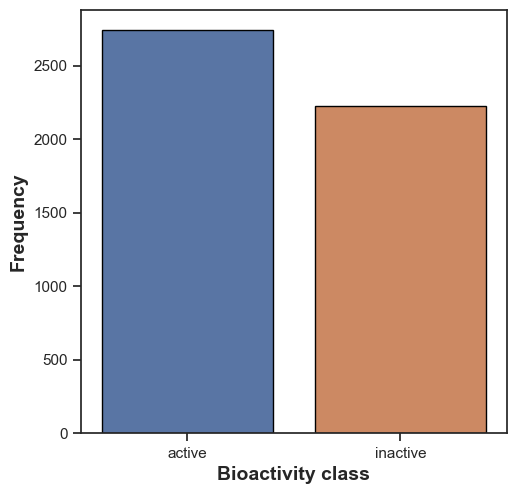

In [37]:
plt.figure(figsize=(5.5, 5.5))
sns.countplot(x = 'class', data = df_2class, edgecolor= 'black')
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('Frequency', fontsize=14, fontweight='bold')
plt.savefig('plot_bioactivity_class.pdf')

# pIC50 Values

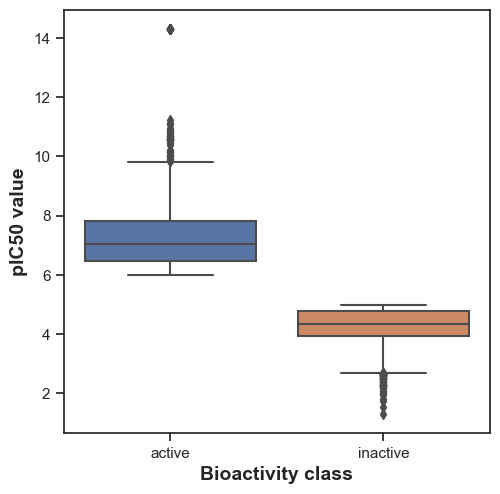

In [38]:
plt.figure(figsize=(5.5, 5.5))
sns.boxplot(x = 'class', y = 'pIC50', data = df_2class)
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('pIC50 value', fontsize=14, fontweight='bold')
plt.savefig('plot_pIC50.pdf')

# Statistical Analyis: Mann-Whitney U Test

Reference: https://machinelearningmastery.com/nonparametric-statistical-significance-tests-in-python/

In [39]:
from scipy.stats import mannwhitneyu

def mann_whitney_test(df, descriptor, class_column='class', alpha=0.05):
    active_data = df[df[class_column] == 'active'][descriptor]
    inactive_data = df[df[class_column] == 'inactive'][descriptor]
    
    stat, p = mannwhitneyu(active_data, inactive_data)
    
    if p > alpha:
        interpretation = 'Same distribution (fail to reject H0)'
    else:
        interpretation = 'Different distribution (reject H0)'
    
    results = pd.DataFrame({
        "Descriptor": [descriptor],
        "P-value": [p],
        "Alpha": [alpha],
        "Interpretation": [interpretation]
    })
    
    filename = 'mannwhitneyu_' + descriptor + '.csv'
    results.to_csv(filename, index=False)
    
    return results

The stat (or test statistic) is the U statistic computed by the Mann-Whitney U test.
This statistic quantifies the difference between the ranks of the two samples (active vs. inactive).
The idea behind the U statistic is to compare the ranks of the values in both groups.
It measures how much overlap there is between the two distributions. A small U value suggests that the two samples are significantly different, while a large U value indicates more overlap.

In the context of the Mann-Whitney U test, the null hypothesis (H₀) states that the two samples come from the same distribution (i.e., the distributions of the active and inactive groups are identical).
If p is small (typically < 0.05), this indicates strong evidence against the null hypothesis, and we reject the null hypothesis, concluding that the two samples come from different distributions (i.e., there is a significant difference between active and inactive groups).
If p is large (typically ≥ 0.05), we fail to reject the null hypothesis, suggesting that there is no significant difference between the two samples and they could come from the same distribution.

# pIC50

In [40]:
mann_whitney_test(df_2class, "pIC50")

,Descriptor,P-value,Alpha,Interpretation
0,pIC50,0.0,0.05,Different distribution (reject H0)


The test statistic (U statistic) here is quite large, which means that the ranks of the two samples (e.g., active vs. inactive groups) differ substantially. This suggests that there is a significant difference between the two groups in terms of the descriptor you are testing.

The p-value of 0.000 indicates extremely strong evidence against the null hypothesis (H₀), which states that the two samples come from the same distribution. In this case, a p-value of 0.000 (which is less than the usual threshold of 0.05) suggests that there is a statistically significant difference between the two distributions (e.g., active vs. inactive).

# Molecular Weight

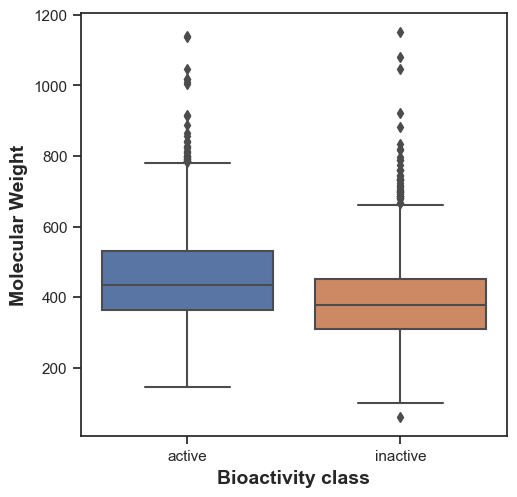

In [41]:
plt.figure(figsize=(5.5, 5.5))
sns.boxplot(x = 'class', y = 'MolWt', data = df_2class)
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('Molecular Weight', fontsize=14, fontweight='bold')
plt.savefig('plot_MolWt.pdf')

In [42]:
mann_whitney_test(df_2class, "MolWt")

,Descriptor,P-value,Alpha,Interpretation
0,MolWt,9.051244e-71,0.05,Different distribution (reject H0)


# Molecular logP

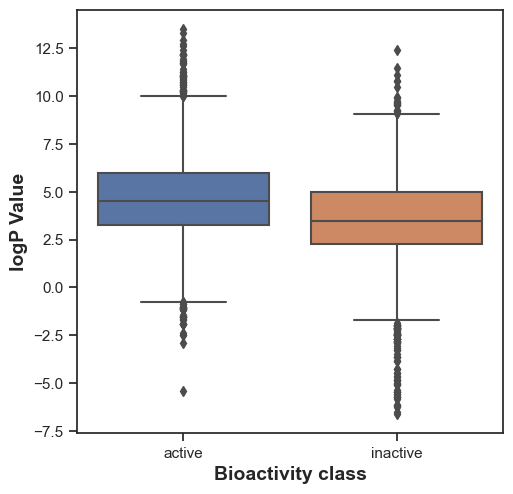

In [43]:
plt.figure(figsize=(5.5, 5.5))
sns.boxplot(x = 'class', y = 'MolLogP', data = df_2class)
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('logP Value', fontsize=14, fontweight='bold')
plt.savefig('plot_MolLogP.pdf')

In [44]:
mann_whitney_test(df_2class, "MolLogP")

,Descriptor,P-value,Alpha,Interpretation
0,MolLogP,2.602070e-61,0.05,Different distribution (reject H0)


# Number of Hydrogen Acceptors

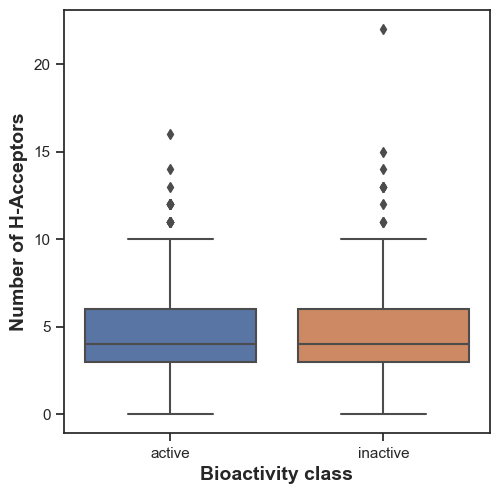

In [45]:
plt.figure(figsize=(5.5, 5.5))
sns.boxplot(x = 'class', y = 'NumHAcceptors', data = df_2class)
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('Number of H-Acceptors', fontsize=14, fontweight='bold')
plt.savefig('plot_NumHAcceptors.pdf')

In [46]:
mann_whitney_test(df_2class, "NumHAcceptors")

,Descriptor,P-value,Alpha,Interpretation
0,NumHAcceptors,9.862157e-07,0.05,Different distribution (reject H0)


# Number of Hydrogen Donors

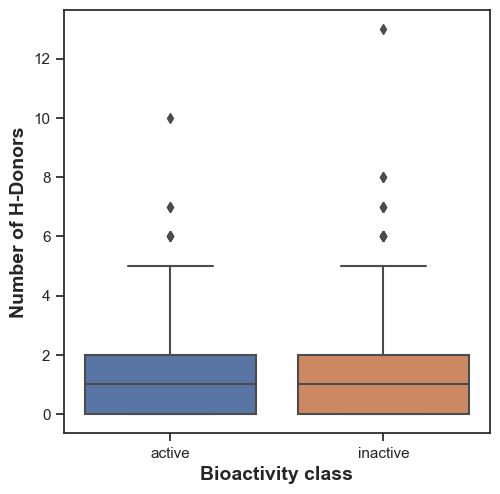

In [47]:
plt.figure(figsize=(5.5, 5.5))
sns.boxplot(x = 'class', y = 'NumHDonors', data = df_2class)
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('Number of H-Donors', fontsize=14, fontweight='bold')
plt.savefig('plot_NumHDonors.pdf')

In [48]:
mann_whitney_test(df_2class, "NumHDonors")

,Descriptor,P-value,Alpha,Interpretation
0,NumHDonors,1.100628e-17,0.05,Different distribution (reject H0)


# Descriptor Calculation and Dataset Preparation

Download PaDEL-Descriptor

In [49]:
selection = ['canonical_smiles', 'molecule_chembl_id']
df_selected = df_final[selection]
df_selected.to_csv('molecule.smi', sep='\t', index = False, header = False)

In [50]:
with open('molecule.smi', 'r') as file:
    print(*file.readlines()[:10], sep='')

CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1	CHEMBL133897
O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1	CHEMBL336398
CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1	CHEMBL131588
O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F	CHEMBL130628
CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C	CHEMBL130478
CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1	CHEMBL130112
CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C	CHEMBL130098
CCCCCCSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N1CCOCC1	CHEMBL337486
COc1ccc(-c2nc(SC)n(C(=O)N(C)C)n2)cc1	CHEMBL336538
CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)c1ccccc1	CHEMBL131051



In [51]:
import glob
xml_files = glob.glob("*.xml")
xml_files.sort()
xml_files

['AtomPairs2DFingerprintCount.xml',
 'AtomPairs2DFingerprinter.xml',
 'EStateFingerprinter.xml',
 'ExtendedFingerprinter.xml',
 'Fingerprinter.xml',
 'GraphOnlyFingerprinter.xml',
 'KlekotaRothFingerprintCount.xml',
 'KlekotaRothFingerprinter.xml',
 'MACCSFingerprinter.xml',
 'PubchemFingerprinter.xml',
 'SubstructureFingerprintCount.xml',
 'SubstructureFingerprinter.xml',
 'descriptors.xml']

In [52]:
FP_list = ['AtomPairs2DCount',
 'AtomPairs2D',
 'EState',
 'CDKextended',
 'CDK',
 'CDKgraphonly',
 'KlekotaRothCount',
 'KlekotaRoth',
 'MACCS',
 'PubChem',
 'SubstructureCount',
 'Substructure']

In [53]:
fp = dict(zip(FP_list, xml_files))
fp

{'AtomPairs2DCount': 'AtomPairs2DFingerprintCount.xml',
 'AtomPairs2D': 'AtomPairs2DFingerprinter.xml',
 'EState': 'EStateFingerprinter.xml',
 'CDKextended': 'ExtendedFingerprinter.xml',
 'CDK': 'Fingerprinter.xml',
 'CDKgraphonly': 'GraphOnlyFingerprinter.xml',
 'KlekotaRothCount': 'KlekotaRothFingerprintCount.xml',
 'KlekotaRoth': 'KlekotaRothFingerprinter.xml',
 'MACCS': 'MACCSFingerprinter.xml',
 'PubChem': 'PubchemFingerprinter.xml',
 'SubstructureCount': 'SubstructureFingerprintCount.xml',
 'Substructure': 'SubstructureFingerprinter.xml'}

In [54]:
df_selected.head(10)

,canonical_smiles,molecule_chembl_id
0,CCOc1nn(-c2cccc(OCc3ccccc3)c2)c(=O)o1,CHEMBL133897
1,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC1CC1,CHEMBL336398
2,CN(C(=O)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F)c1ccccc1,CHEMBL131588
3,O=C(N1CCCCC1)n1nc(-c2ccc(Cl)cc2)nc1SCC(F)(F)F,CHEMBL130628
4,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)C,CHEMBL130478
5,CSc1nc(-c2ccc(C)cc2)nn1C(=O)N(C)c1ccccc1,CHEMBL130112
6,CSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N(C)C,CHEMBL130098
7,CCCCCCSc1nc(-c2ccc(Cl)cc2)nn1C(=O)N1CCOCC1,CHEMBL337486
8,COc1ccc(-c2nc(SC)n(C(=O)N(C)C)n2)cc1,CHEMBL336538
9,CSc1nc(-c2ccc(OC(F)(F)F)cc2)nn1C(=O)N(C)c1ccccc1,CHEMBL131051


In [55]:
! pip install padelpy

In [56]:
fp

{'AtomPairs2DCount': 'AtomPairs2DFingerprintCount.xml',
 'AtomPairs2D': 'AtomPairs2DFingerprinter.xml',
 'EState': 'EStateFingerprinter.xml',
 'CDKextended': 'ExtendedFingerprinter.xml',
 'CDK': 'Fingerprinter.xml',
 'CDKgraphonly': 'GraphOnlyFingerprinter.xml',
 'KlekotaRothCount': 'KlekotaRothFingerprintCount.xml',
 'KlekotaRoth': 'KlekotaRothFingerprinter.xml',
 'MACCS': 'MACCSFingerprinter.xml',
 'PubChem': 'PubchemFingerprinter.xml',
 'SubstructureCount': 'SubstructureFingerprintCount.xml',
 'Substructure': 'SubstructureFingerprinter.xml'}

In [57]:
# from padelpy import padeldescriptor

# fingerprints = ['MACCS', 'Substructure', 'EState', 'PubChem', 'KlekotaRoth', 'AtomPairs2D', 'CDKextended', 'SubstructureCount']
# fingerprint_descriptortypes = [
#     'MACCSFingerprinter.xml',
#     'SubstructureFingerprinter.xml',
#     'EStateFingerprinter.xml',
#     'PubchemFingerprinter.xml',
#     'KlekotaRothFingerprinter.xml',
#     'AtomPairs2DFingerprinter.xml',
#     'ExtendedFingerprinter.xml',
#     'SubstructureFingerprintCount.xml'
# ]

# output_files = {fp: f"{fp}_Descriptors.csv" for fp in fingerprints}

# for fp, xml_file in zip(fingerprints, fingerprint_descriptortypes):
#     print(f"Generating descriptors for: {fp}")
#     padeldescriptor(
#         mol_dir='molecule.smi',  
#         d_file=output_files[fp],  
#         descriptortypes=xml_file,  
#         detectaromaticity=True,
#         standardizenitro=True,
#         standardizetautomers=True,
#         threads=2,
#         removesalt=True,
#         log=True,
#         fingerprints=True
#     )
#     print(f"{fp} descriptors saved in: {output_files[fp]}")

In [58]:
import pandas as pd
descriptors_to_combine = [
    'PubChem_Descriptors.csv',
    'CDKextended_Descriptors.csv',
    'KlekotaRoth_Descriptors.csv'
]

descriptors = pd.concat([pd.read_csv(file) for file in descriptors_to_combine], axis=1)
descriptors.to_csv("Combined_PubChem_CDK_Klekota.csv", index=False)

# descriptors = pd.read_csv('PubChem_Descriptors.csv')
descriptors.head(10)

Name  PubchemFP0  PubchemFP1  PubchemFP2  PubchemFP3  PubchemFP4  \
0  CHEMBL133897           1           1           1           0           0   
1  CHEMBL336398           1           1           1           0           0   
2  CHEMBL131588           1           1           0           0           0   
3  CHEMBL130628           1           1           1           0           0   
4  CHEMBL130478           1           1           0           0           0   
5  CHEMBL130112           1           1           1           0           0   
6  CHEMBL130098           1           1           0           0           0   
7  CHEMBL337486           1           1           1           0           0   
8  CHEMBL336538           1           1           1           0           0   
9  CHEMBL131051           1           1           0           0           0   

   PubchemFP5  PubchemFP6  PubchemFP7  PubchemFP8  PubchemFP9  PubchemFP10  \
0           0           0           0           0           1            1   
1           0           0           0           0           1            1   
2           0           0           0           0           1            1   
3           0           0           0           0           1            1   
4           0           0           0           0           1            1   
5           0           0           0           0           1            1   
6           0           0           0           0           1            1   
7           0           0           0           0           1            1   
8           0           0           0           0           1            1   
9           0           0           0           0           1            1   

   PubchemFP11  PubchemFP12  PubchemFP13  PubchemFP14  PubchemFP15  \
0            1            1            0            1            1   
1            1            1            0            1            1   
2            1            1            0            1            1   
3            1            1            0            1            1   
4            1            0            0            1            1   
5            1            1            0            1            1   
6            1            0            0            1            1   
7            1            1            0            1            1   
8            1            0            0            1            1   
9            1            1            0            1            1   

   PubchemFP16  PubchemFP17  PubchemFP18  PubchemFP19  PubchemFP20  \
0            0            0            1            1            1   
1            1            0            1            0            0   
2            1            0            1            0            0   
3            1            0            1            0            0   
4            1            0            1            1            0   
5            1            0            1            0            0   
6            1            0            1            0            0   
7            1            0            1            1            0   
8            1            0            1            1            0   
9            1            0            1            1            0   

   PubchemFP21  PubchemFP22  PubchemFP23  PubchemFP24  PubchemFP25  \
0            0            0            0            0            0   
1            0            0            0            0            0   
2            0            0            1            1            0   
3            0            0            1            1            0   
4            0            0            1            1            0   
5            0            0            0            0            0   
6            0            0            0            0            0   
7            0            0            0            0            0   
8            0            0            0            0            0   
9            0            0            1

# Preparing X and Y Data Matrices

In [59]:
X_df = descriptors.drop(columns=['Name'])
X_df.head(10)

PubchemFP0  PubchemFP1  PubchemFP2  PubchemFP3  PubchemFP4  PubchemFP5  \
0           1           1           1           0           0           0   
1           1           1           1           0           0           0   
2           1           1           0           0           0           0   
3           1           1           1           0           0           0   
4           1           1           0           0           0           0   
5           1           1           1           0           0           0   
6           1           1           0           0           0           0   
7           1           1           1           0           0           0   
8           1           1           1           0           0           0   
9           1           1           0           0           0           0   

   PubchemFP6  PubchemFP7  PubchemFP8  PubchemFP9  PubchemFP10  PubchemFP11  \
0           0           0           0           1            1            1   
1           0           0           0           1            1            1   
2           0           0           0           1            1            1   
3           0           0           0           1            1            1   
4           0           0           0           1            1            1   
5           0           0           0           1            1            1   
6           0           0           0           1            1            1   
7           0           0           0           1            1            1   
8           0           0           0           1            1            1   
9           0           0           0           1            1            1   

   PubchemFP12  PubchemFP13  PubchemFP14  PubchemFP15  PubchemFP16  \
0            1            0            1            1            0   
1            1            0            1            1            1   
2            1            0            1            1            1   
3            1            0            1            1            1   
4            0            0            1            1            1   
5            1            0            1            1            1   
6            0            0            1            1            1   
7            1            0            1            1            1   
8            0            0            1            1            1   
9            1            0            1            1            1   

   PubchemFP17  PubchemFP18  PubchemFP19  PubchemFP20  PubchemFP21  \
0            0            1            1            1            0   
1            0            1            0            0            0   
2            0            1            0            0            0   
3            0            1            0            0            0   
4            0            1            1            0            0   
5            0            1            0            0            0   
6            0            1            0            0            0   
7            0            1            1            0            0   
8            0            1            1            0            0   
9            0            1            1            0            0   

   PubchemFP22  PubchemFP23  PubchemFP24  PubchemFP25  PubchemFP26  \
0            0            0            0            0            0   
1            0            0            0            0            0   
2            0            1            1            0            0   
3            0            1            1            0            0   
4            0            1            1            0            0   
5            0            0            0            0            0   
6            0            0            0            0            0   
7            0            0            0            0            0   
8            0            0            0            0            0   
9            0            1            1   

In [60]:
Y_df = df_final['pIC50']
Y_df.head(10)

0    6.124939
1    7.000000
2    4.301030
3    6.522879
4    6.096910
5    5.619789
6    7.000000
7    4.301030
8    6.096910
9    4.301030
Name: pIC50, dtype: float64

In [61]:
dataset = pd.concat([X_df.reset_index(drop=True), Y_df.reset_index(drop=True)], axis=1)

In [62]:
dataset.head(10)

PubchemFP0  PubchemFP1  PubchemFP2  PubchemFP3  PubchemFP4  PubchemFP5  \
0           1           1           1           0           0           0   
1           1           1           1           0           0           0   
2           1           1           0           0           0           0   
3           1           1           1           0           0           0   
4           1           1           0           0           0           0   
5           1           1           1           0           0           0   
6           1           1           0           0           0           0   
7           1           1           1           0           0           0   
8           1           1           1           0           0           0   
9           1           1           0           0           0           0   

   PubchemFP6  PubchemFP7  PubchemFP8  PubchemFP9  PubchemFP10  PubchemFP11  \
0           0           0           0           1            1            1   
1           0           0           0           1            1            1   
2           0           0           0           1            1            1   
3           0           0           0           1            1            1   
4           0           0           0           1            1            1   
5           0           0           0           1            1            1   
6           0           0           0           1            1            1   
7           0           0           0           1            1            1   
8           0           0           0           1            1            1   
9           0           0           0           1            1            1   

   PubchemFP12  PubchemFP13  PubchemFP14  PubchemFP15  PubchemFP16  \
0            1            0            1            1            0   
1            1            0            1            1            1   
2            1            0            1            1            1   
3            1            0            1            1            1   
4            0            0            1            1            1   
5            1            0            1            1            1   
6            0            0            1            1            1   
7            1            0            1            1            1   
8            0            0            1            1            1   
9            1            0            1            1            1   

   PubchemFP17  PubchemFP18  PubchemFP19  PubchemFP20  PubchemFP21  \
0            0            1            1            1            0   
1            0            1            0            0            0   
2            0            1            0            0            0   
3            0            1            0            0            0   
4            0            1            1            0            0   
5            0            1            0            0            0   
6            0            1            0            0            0   
7            0            1            1            0            0   
8            0            1            1            0            0   
9            0            1            1            0            0   

   PubchemFP22  PubchemFP23  PubchemFP24  PubchemFP25  PubchemFP26  \
0            0            0            0            0            0   
1            0            0            0            0            0   
2            0            1            1            0            0   
3            0            1            1            0            0   
4            0            1            1            0            0   
5            0            0            0            0            0   
6            0            0            0            0            0   
7            0            0            0            0            0   
8            0            0            0            0            0   
9            0            1            1   

In [63]:
dataset.to_csv('acetylcholinesterase_bioactivity_data_pIC50.csv', index=False)

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [65]:
X = dataset.drop('pIC50', axis=1)
X.head(10)

PubchemFP0  PubchemFP1  PubchemFP2  PubchemFP3  PubchemFP4  PubchemFP5  \
0           1           1           1           0           0           0   
1           1           1           1           0           0           0   
2           1           1           0           0           0           0   
3           1           1           1           0           0           0   
4           1           1           0           0           0           0   
5           1           1           1           0           0           0   
6           1           1           0           0           0           0   
7           1           1           1           0           0           0   
8           1           1           1           0           0           0   
9           1           1           0           0           0           0   

   PubchemFP6  PubchemFP7  PubchemFP8  PubchemFP9  PubchemFP10  PubchemFP11  \
0           0           0           0           1            1            1   
1           0           0           0           1            1            1   
2           0           0           0           1            1            1   
3           0           0           0           1            1            1   
4           0           0           0           1            1            1   
5           0           0           0           1            1            1   
6           0           0           0           1            1            1   
7           0           0           0           1            1            1   
8           0           0           0           1            1            1   
9           0           0           0           1            1            1   

   PubchemFP12  PubchemFP13  PubchemFP14  PubchemFP15  PubchemFP16  \
0            1            0            1            1            0   
1            1            0            1            1            1   
2            1            0            1            1            1   
3            1            0            1            1            1   
4            0            0            1            1            1   
5            1            0            1            1            1   
6            0            0            1            1            1   
7            1            0            1            1            1   
8            0            0            1            1            1   
9            1            0            1            1            1   

   PubchemFP17  PubchemFP18  PubchemFP19  PubchemFP20  PubchemFP21  \
0            0            1            1            1            0   
1            0            1            0            0            0   
2            0            1            0            0            0   
3            0            1            0            0            0   
4            0            1            1            0            0   
5            0            1            0            0            0   
6            0            1            0            0            0   
7            0            1            1            0            0   
8            0            1            1            0            0   
9            0            1            1            0            0   

   PubchemFP22  PubchemFP23  PubchemFP24  PubchemFP25  PubchemFP26  \
0            0            0            0            0            0   
1            0            0            0            0            0   
2            0            1            1            0            0   
3            0            1            1            0            0   
4            0            1            1            0            0   
5            0            0            0            0            0   
6            0            0            0            0            0   
7            0            0            0            0            0   
8            0            0            0            0            0   
9            0            1            1   

In [66]:
Y = dataset.pIC50
Y.head(10)

0    6.124939
1    7.000000
2    4.301030
3    6.522879
4    6.096910
5    5.619789
6    7.000000
7    4.301030
8    6.096910
9    4.301030
Name: pIC50, dtype: float64

In [67]:
X.shape

(6641, 6765)

In [68]:
Y.shape

(6641,)

In [69]:
from sklearn.feature_selection import VarianceThreshold

def remove_low_variance(input_data, threshold=0.1):
    selection = VarianceThreshold(threshold)
    selection.fit(input_data)
    return input_data[input_data.columns[selection.get_support(indices=True)]]

X = remove_low_variance(X, threshold=0.1)
X.head(10)

PubchemFP0  PubchemFP1  PubchemFP2  PubchemFP3  PubchemFP12  PubchemFP13  \
0           1           1           1           0            1            0   
1           1           1           1           0            1            0   
2           1           1           0           0            1            0   
3           1           1           1           0            1            0   
4           1           1           0           0            0            0   
5           1           1           1           0            1            0   
6           1           1           0           0            0            0   
7           1           1           1           0            1            0   
8           1           1           1           0            0            0   
9           1           1           0           0            1            0   

   PubchemFP15  PubchemFP16  PubchemFP19  PubchemFP20  PubchemFP33  \
0            1            0            1            1            0   
1            1            1            0            0            1   
2            1            1            0            0            1   
3            1            1            0            0            1   
4            1            1            1            0            1   
5            1            1            0            0            1   
6            1            1            0            0            1   
7            1            1            1            0            1   
8            1            1            1            0            1   
9            1            1            1            0            1   

   PubchemFP37  PubchemFP143  PubchemFP145  PubchemFP146  PubchemFP150  \
0            0             1             0             0             0   
1            1             1             1             1             0   
2            1             1             1             1             0   
3            1             1             1             1             0   
4            0             1             1             1             0   
5            0             1             1             1             0   
6            1             1             1             1             0   
7            1             1             1             1             0   
8            0             1             1             1             0   
9            0             1             1             1             0   

   PubchemFP180  PubchemFP181  PubchemFP184  PubchemFP185  PubchemFP186  \
0             0             0             0             1             1   
1             1             1             0             1             0   
2             0             0             0             1             1   
3             1             1             0             1             0   
4             0             0             0             0             0   
5             0             0             0             1             1   
6             0             0             0             0             0   
7             1             1             0             1             0   
8             0             0             0             0             0   
9             0             0             0             1             1   

   PubchemFP187  PubchemFP188  PubchemFP192  PubchemFP193  PubchemFP199  \
0             0             0             0             0             0   
1             0             0             0             0             0   
2             0             0             0             0             0   
3             0             0             0             0             0   
4             0             0             0             0             0   
5             0             0             0             0             0   
6             0             0             0             0             0   
7             0             0             0             0             0   
8             0             0             0   

In [70]:
X.shape

(6641, 1275)

In [71]:
X.to_csv("Combined_PubChem_CDK_Klekota_modified.csv", index = False)

# Data split (80/20 ratio)

In [72]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

In [73]:
X_train.shape, Y_train.shape

((5312, 1275), (5312,))

In [74]:
X_test.shape, Y_test.shape

((1329, 1275), (1329,))

In [75]:
# X_train.isna().sum()

# Building a Regression Model using Random Forest

In [76]:
np.random.seed(42)
model = RandomForestRegressor(n_estimators=200)
model.fit(X_train, Y_train)
r2 = model.score(X_test, Y_test)
r2

0.7223526681876642

In [77]:
Y_pred = model.predict(X_test)

In [78]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
rmse

0.7935966302944027

In [79]:
mae = mean_absolute_error(Y_test, Y_pred)
mae

0.5516343305731658

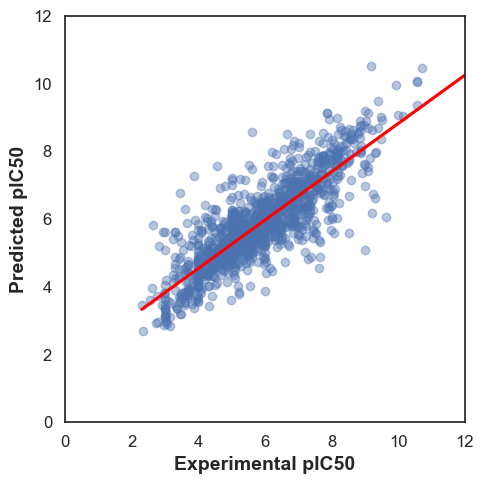

In [80]:
sns.set_style("white")

plt.figure(figsize = (5, 5))  
ax = sns.regplot(
    x = Y_test, y = Y_pred,  
    scatter_kws = {'alpha': 0.4},  
    line_kws = {'color': 'red'},  
    ci = None  
)

ax.set_xlabel('Experimental pIC50', fontsize=14, fontweight='bold')
ax.set_ylabel('Predicted pIC50', fontsize=14, fontweight='bold')

ax.set_xlim(0, 12)
ax.set_ylim(0, 12)

ax.tick_params(axis='both', which='major', labelsize=12)

plt.tight_layout()  
plt.show()

In [81]:
def evaluate_model_performance(X, Y, model, model_name = "Model"):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    r2 = r2_score(Y_test, Y_pred)
    rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
    mae = mean_absolute_error(Y_test, Y_pred)
    
    return {
        "R-squared": r2,
        "RMSE": rmse,
        "MAE": mae
    }

In [82]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
pd.options.display.float_format = '{:.4f}'.format

models = {    
    "Random Forest": RandomForestRegressor(n_estimators=200, random_state=42),      
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=200, learning_rate=0.05, random_state=42),    
    "Decision Tree": DecisionTreeRegressor(max_depth=10, random_state=42),  
    "Support Vector Regressor": SVR(kernel='rbf', C=2.0),  
    "K-Nearest Neighbors": KNeighborsRegressor(n_neighbors=20),  
    "XGBoost": XGBRegressor(n_estimators=200, learning_rate=0.05, random_state=42),  
}

results = {}

for model_name, model in models.items():
    print(f"Evaluating {model_name}...")
    metrics = evaluate_model_performance(X, Y, model, model_name=model_name)
    results[model_name] = metrics

results_df = pd.DataFrame(results).T  
results_df.reset_index(inplace=True)  
results_df.rename(columns={'index': 'Model'}, inplace=True)  

sorted_results = results_df.sort_values(
    by=['R-squared', 'RMSE', 'MAE'], 
    ascending=[False, True, True]
)

print(sorted_results.to_string(index=False))

Evaluating Random Forest...
Evaluating Gradient Boosting...
Evaluating Decision Tree...
Evaluating Support Vector Regressor...
Evaluating K-Nearest Neighbors...
Evaluating XGBoost...
                   Model  R-squared   RMSE    MAE
Support Vector Regressor     0.7512 0.7732 0.5353
           Random Forest     0.7499 0.7752 0.5422
                 XGBoost     0.7483 0.7777 0.5505
       Gradient Boosting     0.6288 0.9443 0.7236
     K-Nearest Neighbors     0.5791 1.0056 0.7486
           Decision Tree     0.5471 1.0432 0.7389


In [83]:
model = SVR(kernel='rbf', C=2.0)
model.fit(X, Y)
model

SVR(C=2.0)

In [84]:
r2 = model.score(X, Y)
r2

0.8768644841391089

In [85]:
# Y_pred = model.predict(X)
# Y_pred

# Save Model as Pickle Object

In [86]:
import pickle

In [87]:
pickle.dump(model, open('acetylcholinesterase_model.pkl', 'wb'))